We'll start by loading the necessary libraries and the dataset from Huggingface.

In [2]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from PIL import Image

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

# Download the Huggingface Emoji dataset
from datasets import load_dataset
dataset = load_dataset('valhalla/emoji-dataset')


/Users/tylersmith/anaconda3/envs/summarizer/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Generating train split: 100%|██████████| 2749/2749 [00:00<00:00, 19882.81 examples/s]


We'll filter by "hair" as the theme for our emojis, just for fun. This way we can classify emojis by gender later on. 

In [3]:

def filter_images(dataset, theme):
    filtered_images = []
    for i, text in enumerate(dataset['train']['text']):
        if theme in text:
            filtered_images.append(dataset['train']['image'][i])
    return filtered_images


# Filter the images based on the theme
theme = 'hair'
filtered_images = filter_images(dataset, theme)

# Display the length of the filtered images
print(f"Number of images with the theme '{theme}': {len(filtered_images)}")

# Display the length of the original dataset
print(f"Number of images in the original dataset: {len(dataset['train']['image'])}")


Number of images with the theme 'hair': 61
Number of images in the original dataset: 2749


We'll create a train/validation/test split with a 60-20-20 divide. 

In [10]:
train_images, val_images = train_test_split(filtered_images, test_size=0.4, random_state=42) # 60% for training, 40% for validation and testing
val_images, test_images = train_test_split(val_images, test_size=0.5, random_state=42) # 20% for validation, 20% for testing

# Display the number of images in each set
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")

Number of training images: 36
Number of validation images: 12
Number of test images: 13


We'll resize images to be 64x64 resolution. 

In [12]:
def resize_images(images, size):
    resized_images = []
    for image in images:
        img = image.resize(size)
        resized_images.append(img)
    return resized_images

# Resize the images
size = (64, 64)
train_images = resize_images(train_images, size)
val_images = resize_images(val_images, size)
test_images = resize_images(test_images, size)

Since our subset of the dataset is small, we'll expand to be closer to 600-200-200. 

In [14]:
train_images = train_images * (600 // len(train_images))
val_images = val_images * (200 // len(val_images))
test_images = test_images * (200 // len(test_images))


In [15]:
# Display the length of train_images, val_images, and test_images
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")


Number of training images: 576
Number of validation images: 192
Number of test images: 195


Now, we'll create an EmojiDataset class that will allow for transformations/data augmentation.

In [16]:
class EmojiDataset(Dataset):
    def __init__(self, images, transform=None):
        self.images = images
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        if self.transform:
            image = self.transform(image)
        return image
    

We'll randomly apply horizontal flips and a 30 degree rotation to each dataset for augmentation. 

In [32]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.ToTensor()
])

# Create the training, validation, and test datasets
train_dataset = EmojiDataset(train_images, transform=transform)
val_dataset = EmojiDataset(val_images, transform=transforms.ToTensor())
test_dataset = EmojiDataset(test_images, transform=transforms.ToTensor())


In [38]:
# Create the training, validation, and test dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)


Number of batches in train_dataloader: 18
Number of batches in val_dataloader: 6
Number of batches in test_dataloader: 7


Now we can start cooking with our Autoencoder. We'll take in our image and produce an output image of the same dimensions.

Epoch 1/100 | Training loss: 13.4841
Epoch 1/100 | Validation loss: 13.5335


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


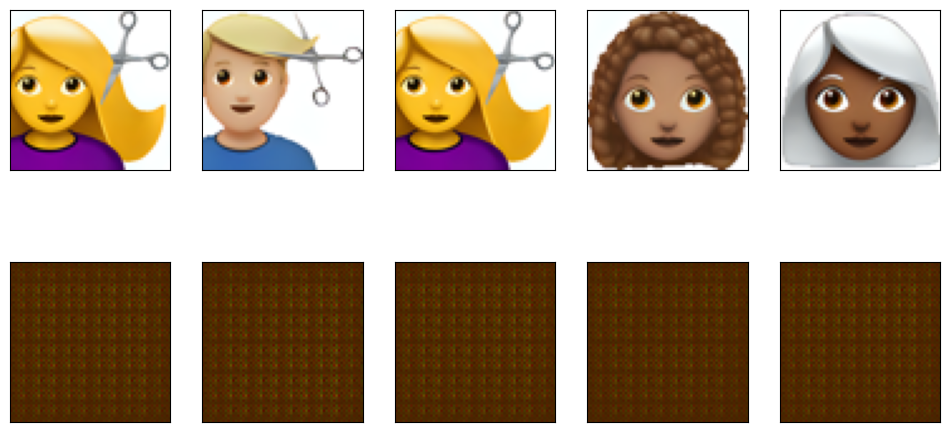

Epoch 2/100 | Training loss: 10.5513
Epoch 2/100 | Validation loss: 9.4323
Epoch 3/100 | Training loss: 7.9172
Epoch 3/100 | Validation loss: 7.5632
Epoch 4/100 | Training loss: 6.3199
Epoch 4/100 | Validation loss: 6.0873


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5/100 | Training loss: 5.0737
Epoch 5/100 | Validation loss: 4.9560


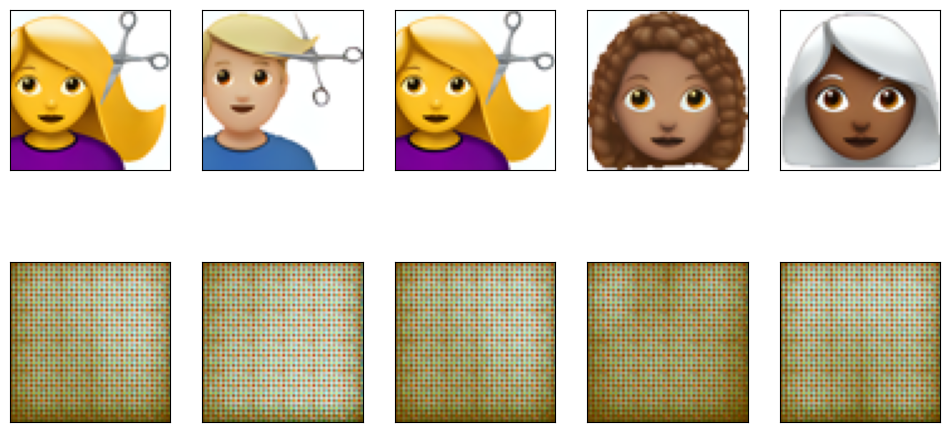

Epoch 6/100 | Training loss: 4.2052
Epoch 6/100 | Validation loss: 4.2736
Epoch 7/100 | Training loss: 3.7231
Epoch 7/100 | Validation loss: 3.7787
Epoch 8/100 | Training loss: 3.4940
Epoch 8/100 | Validation loss: 3.6317
Epoch 9/100 | Training loss: 3.3886
Epoch 9/100 | Validation loss: 3.4009


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10/100 | Training loss: 3.3181
Epoch 10/100 | Validation loss: 3.2548


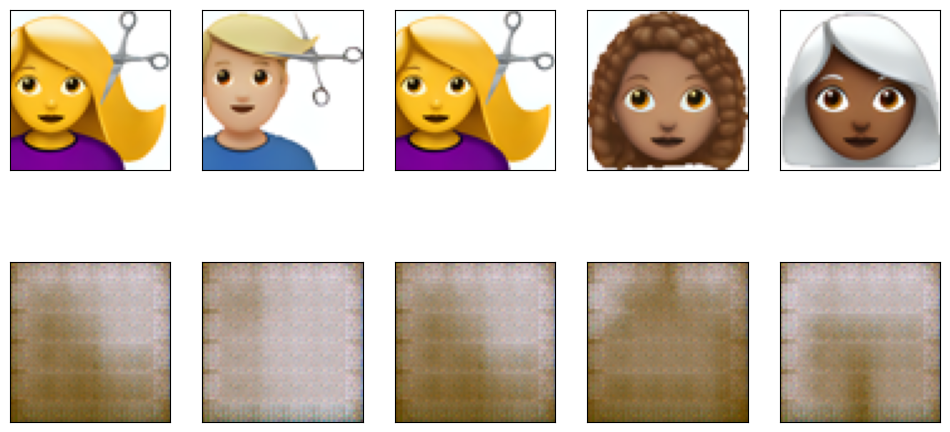

Epoch 11/100 | Training loss: 3.2396
Epoch 11/100 | Validation loss: 3.1752
Epoch 12/100 | Training loss: 3.1785
Epoch 12/100 | Validation loss: 3.0815
Epoch 13/100 | Training loss: 3.1307
Epoch 13/100 | Validation loss: 3.0717
Epoch 14/100 | Training loss: 3.1108
Epoch 14/100 | Validation loss: 3.0193


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 15/100 | Training loss: 3.0432
Epoch 15/100 | Validation loss: 2.9603


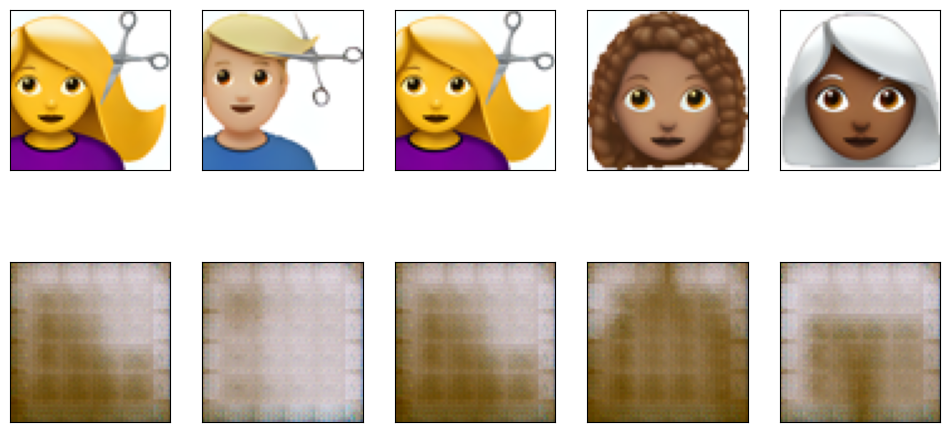

Epoch 16/100 | Training loss: 2.9673
Epoch 16/100 | Validation loss: 2.8633
Epoch 17/100 | Training loss: 2.9378
Epoch 17/100 | Validation loss: 2.7918
Epoch 18/100 | Training loss: 2.8963
Epoch 18/100 | Validation loss: 2.7527
Epoch 19/100 | Training loss: 2.8445
Epoch 19/100 | Validation loss: 2.7147


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20/100 | Training loss: 2.7909
Epoch 20/100 | Validation loss: 2.5973


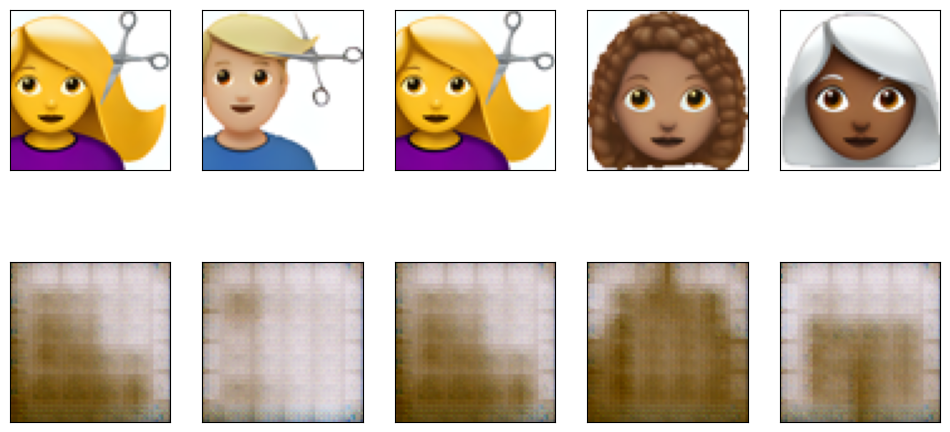

Epoch 21/100 | Training loss: 2.7489
Epoch 21/100 | Validation loss: 2.5986
Epoch 22/100 | Training loss: 2.7419
Epoch 22/100 | Validation loss: 2.6052
Epoch 23/100 | Training loss: 2.6625
Epoch 23/100 | Validation loss: 2.5498
Epoch 24/100 | Training loss: 2.6060
Epoch 24/100 | Validation loss: 2.4409


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 25/100 | Training loss: 2.5909
Epoch 25/100 | Validation loss: 2.4341


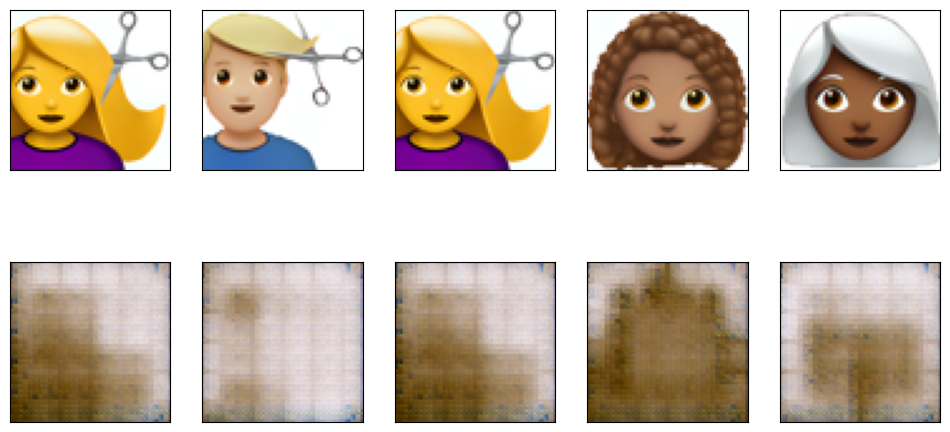

Epoch 26/100 | Training loss: 2.5702
Epoch 26/100 | Validation loss: 2.4271
Epoch 27/100 | Training loss: 2.4969
Epoch 27/100 | Validation loss: 2.3655
Epoch 28/100 | Training loss: 2.4579
Epoch 28/100 | Validation loss: 2.3540
Epoch 29/100 | Training loss: 2.4112
Epoch 29/100 | Validation loss: 2.3161


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30/100 | Training loss: 2.3258
Epoch 30/100 | Validation loss: 2.2287


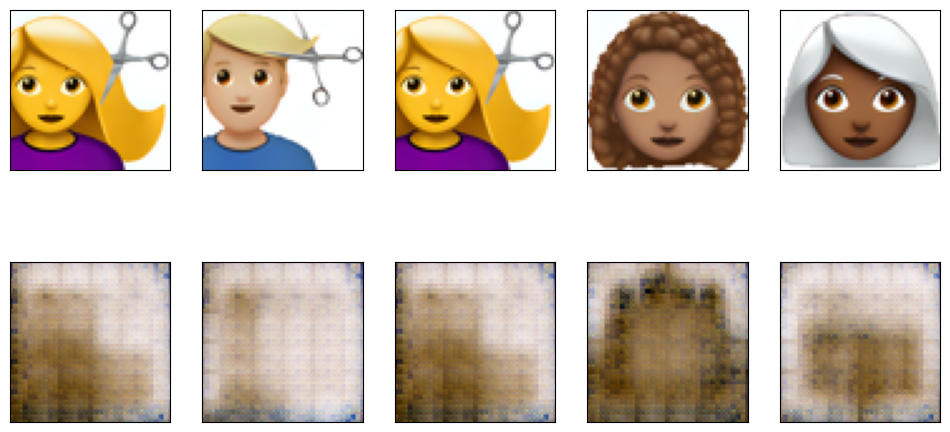

Epoch 31/100 | Training loss: 2.2598
Epoch 31/100 | Validation loss: 2.1606
Epoch 32/100 | Training loss: 2.2141
Epoch 32/100 | Validation loss: 2.0970
Epoch 33/100 | Training loss: 2.1501
Epoch 33/100 | Validation loss: 2.0436
Epoch 34/100 | Training loss: 2.0893
Epoch 34/100 | Validation loss: 1.9726


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 35/100 | Training loss: 2.0322
Epoch 35/100 | Validation loss: 1.9149


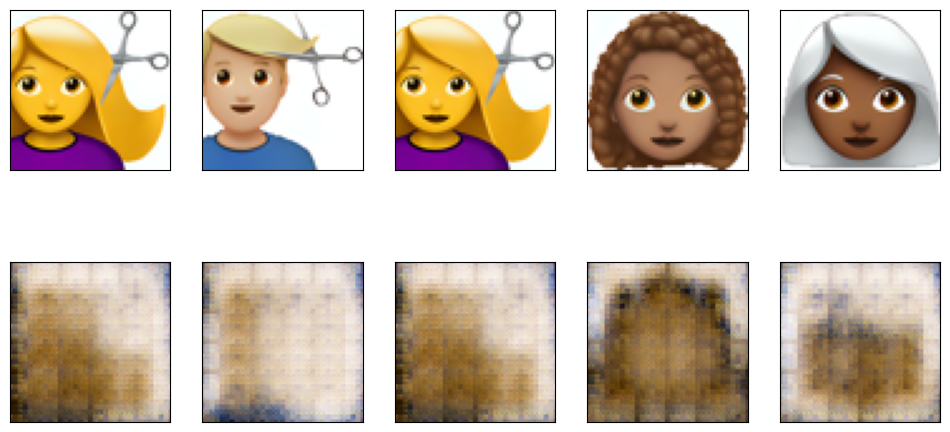

Epoch 36/100 | Training loss: 1.9965
Epoch 36/100 | Validation loss: 1.8778
Epoch 37/100 | Training loss: 1.9387
Epoch 37/100 | Validation loss: 1.8494
Epoch 38/100 | Training loss: 1.9097
Epoch 38/100 | Validation loss: 1.8161
Epoch 39/100 | Training loss: 1.8668
Epoch 39/100 | Validation loss: 1.8054


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40/100 | Training loss: 1.8477
Epoch 40/100 | Validation loss: 1.7658


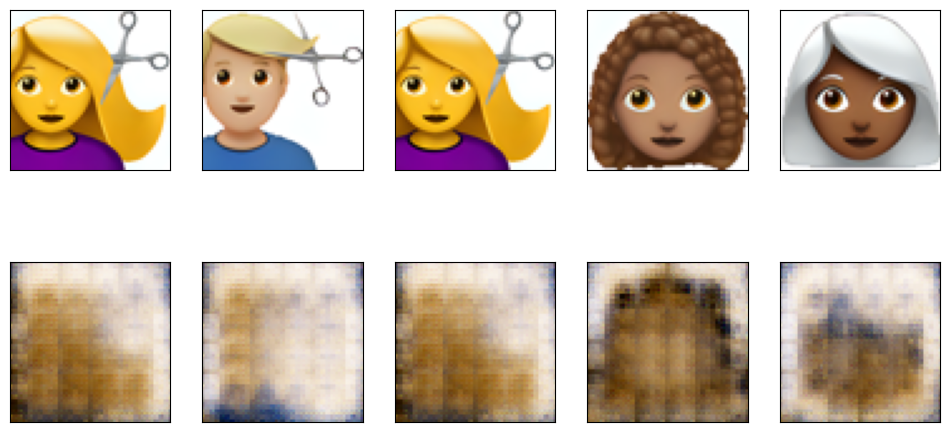

Epoch 41/100 | Training loss: 1.8235
Epoch 41/100 | Validation loss: 1.7440
Epoch 42/100 | Training loss: 1.7990
Epoch 42/100 | Validation loss: 1.7092
Epoch 43/100 | Training loss: 1.7781
Epoch 43/100 | Validation loss: 1.6924
Epoch 44/100 | Training loss: 1.7698
Epoch 44/100 | Validation loss: 1.6770


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 45/100 | Training loss: 1.7495
Epoch 45/100 | Validation loss: 1.6644


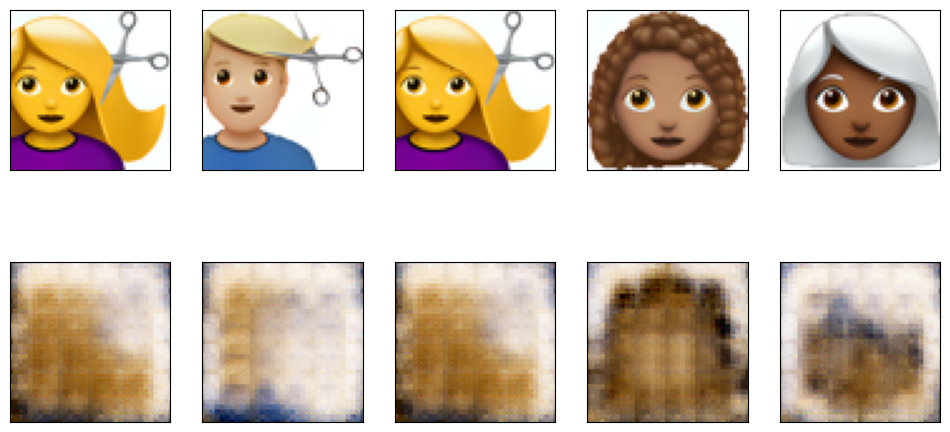

Epoch 46/100 | Training loss: 1.7237
Epoch 46/100 | Validation loss: 1.6196
Epoch 47/100 | Training loss: 1.7183
Epoch 47/100 | Validation loss: 1.6228
Epoch 48/100 | Training loss: 1.7122
Epoch 48/100 | Validation loss: 1.6235
Epoch 49/100 | Training loss: 1.6873
Epoch 49/100 | Validation loss: 1.5962
Epoch 50/100 | Training loss: 1.6715
Epoch 50/100 | Validation loss: 1.6109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


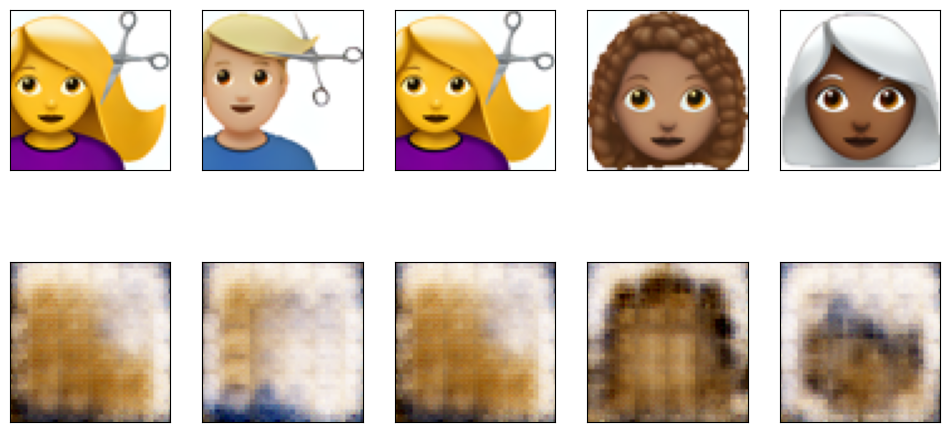

Epoch 51/100 | Training loss: 1.6665
Epoch 51/100 | Validation loss: 1.6030
Epoch 52/100 | Training loss: 1.6591
Epoch 52/100 | Validation loss: 1.5792
Epoch 53/100 | Training loss: 1.6398
Epoch 53/100 | Validation loss: 1.5593
Epoch 54/100 | Training loss: 1.6374
Epoch 54/100 | Validation loss: 1.5417


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 55/100 | Training loss: 1.6285
Epoch 55/100 | Validation loss: 1.5731


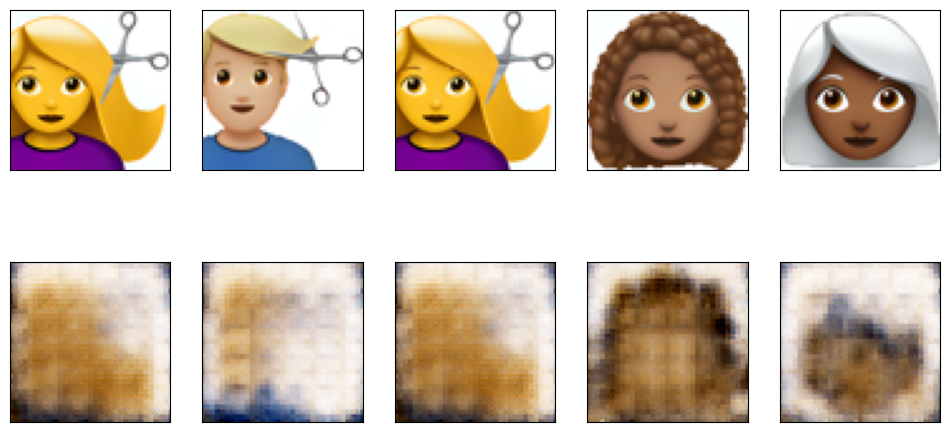

Epoch 56/100 | Training loss: 1.6153
Epoch 56/100 | Validation loss: 1.5290
Epoch 57/100 | Training loss: 1.6094
Epoch 57/100 | Validation loss: 1.5061
Epoch 58/100 | Training loss: 1.5923
Epoch 58/100 | Validation loss: 1.5134
Epoch 59/100 | Training loss: 1.5918
Epoch 59/100 | Validation loss: 1.4900


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60/100 | Training loss: 1.5774
Epoch 60/100 | Validation loss: 1.4978


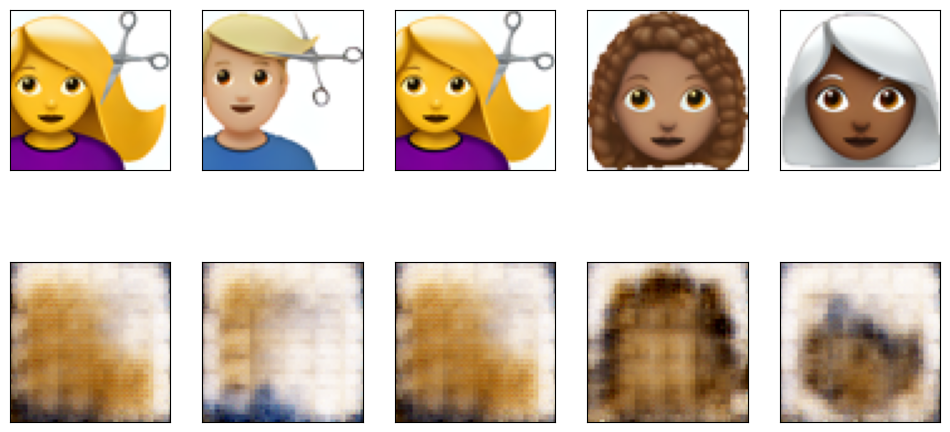

Epoch 61/100 | Training loss: 1.5774
Epoch 61/100 | Validation loss: 1.5081
Epoch 62/100 | Training loss: 1.5689
Epoch 62/100 | Validation loss: 1.4949
Epoch 63/100 | Training loss: 1.5605
Epoch 63/100 | Validation loss: 1.4667
Epoch 64/100 | Training loss: 1.5560
Epoch 64/100 | Validation loss: 1.4837


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 65/100 | Training loss: 1.5441
Epoch 65/100 | Validation loss: 1.4566


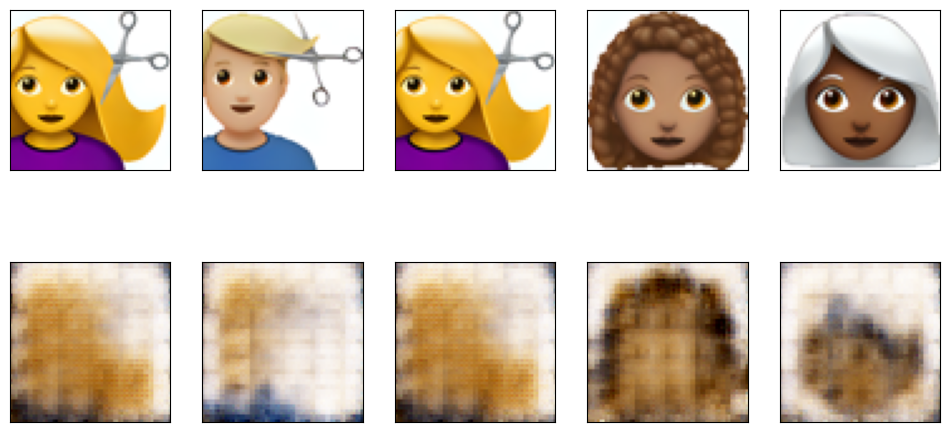

Epoch 66/100 | Training loss: 1.5510
Epoch 66/100 | Validation loss: 1.4639
Epoch 67/100 | Training loss: 1.5381
Epoch 67/100 | Validation loss: 1.4453
Epoch 68/100 | Training loss: 1.5293
Epoch 68/100 | Validation loss: 1.4452
Epoch 69/100 | Training loss: 1.5221
Epoch 69/100 | Validation loss: 1.4588


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70/100 | Training loss: 1.5175
Epoch 70/100 | Validation loss: 1.4320


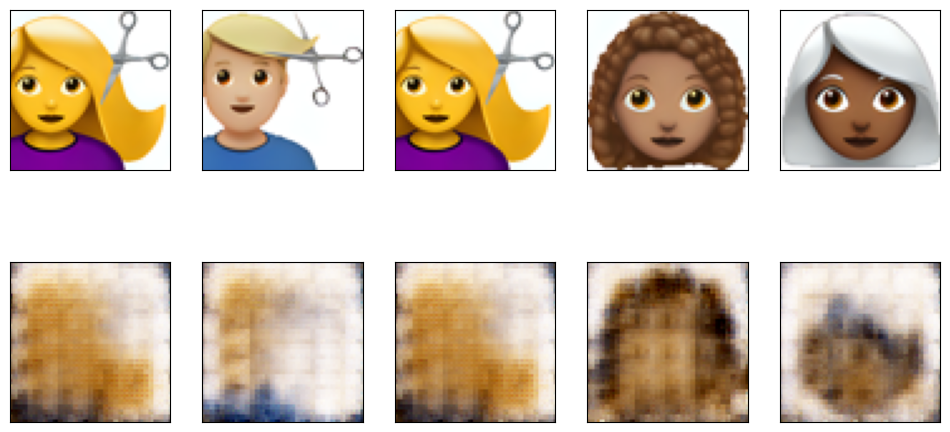

Epoch 71/100 | Training loss: 1.5164
Epoch 71/100 | Validation loss: 1.4189
Epoch 72/100 | Training loss: 1.4969
Epoch 72/100 | Validation loss: 1.4218
Epoch 73/100 | Training loss: 1.5046
Epoch 73/100 | Validation loss: 1.4313
Epoch 74/100 | Training loss: 1.4984
Epoch 74/100 | Validation loss: 1.4152


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 75/100 | Training loss: 1.4830
Epoch 75/100 | Validation loss: 1.4074


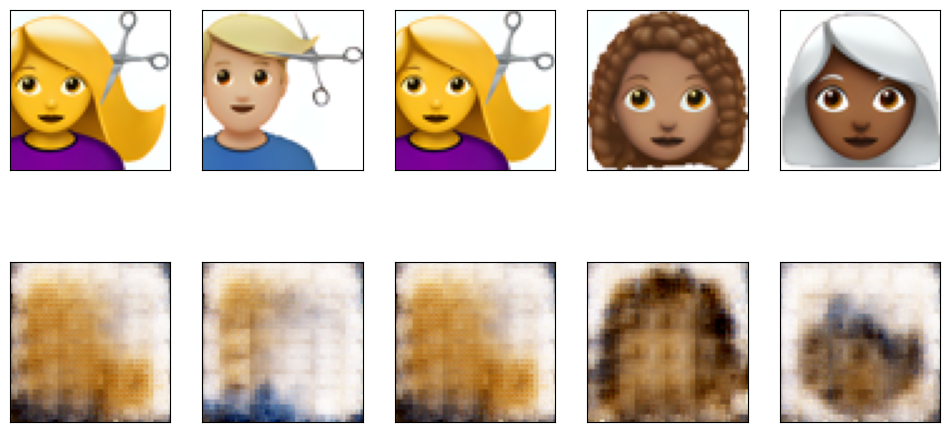

Epoch 76/100 | Training loss: 1.4867
Epoch 76/100 | Validation loss: 1.3993
Epoch 77/100 | Training loss: 1.4794
Epoch 77/100 | Validation loss: 1.4082
Epoch 78/100 | Training loss: 1.4741
Epoch 78/100 | Validation loss: 1.4097
Epoch 79/100 | Training loss: 1.4678
Epoch 79/100 | Validation loss: 1.3983


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80/100 | Training loss: 1.4656
Epoch 80/100 | Validation loss: 1.4028


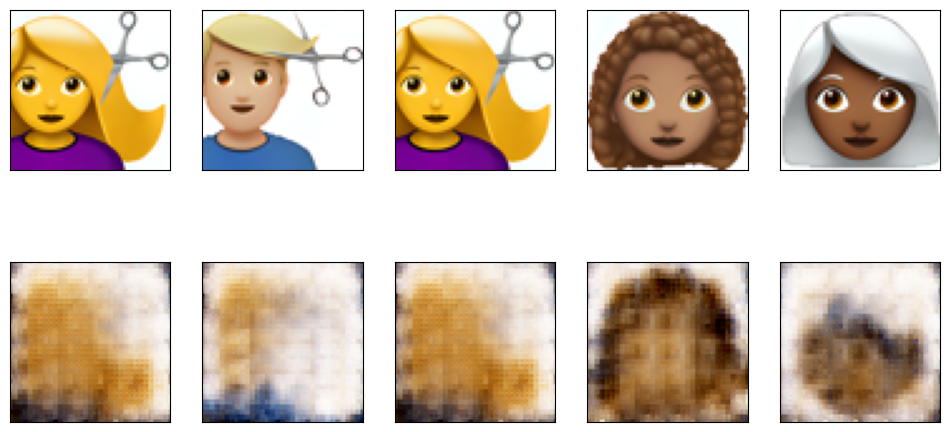

Epoch 81/100 | Training loss: 1.4571
Epoch 81/100 | Validation loss: 1.3739
Epoch 82/100 | Training loss: 1.4490
Epoch 82/100 | Validation loss: 1.3709
Epoch 83/100 | Training loss: 1.4459
Epoch 83/100 | Validation loss: 1.3869
Epoch 84/100 | Training loss: 1.4383
Epoch 84/100 | Validation loss: 1.3651


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 85/100 | Training loss: 1.4358
Epoch 85/100 | Validation loss: 1.3770


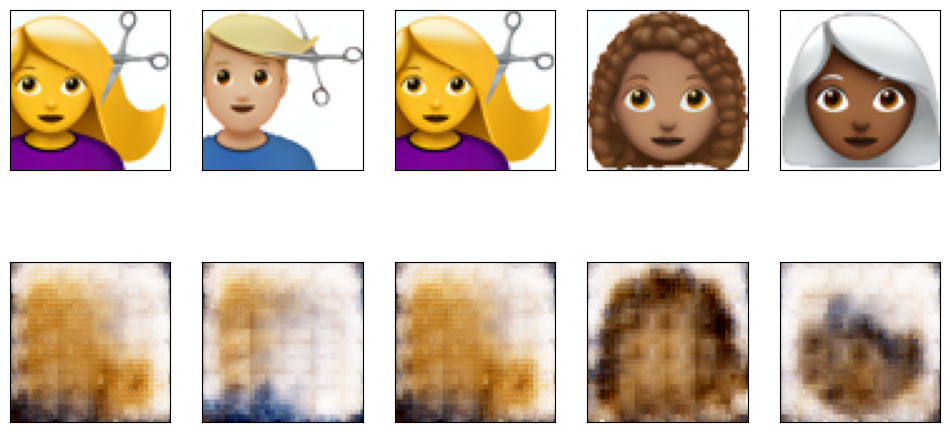

Epoch 86/100 | Training loss: 1.4351
Epoch 86/100 | Validation loss: 1.3535
Epoch 87/100 | Training loss: 1.4375
Epoch 87/100 | Validation loss: 1.3608
Epoch 88/100 | Training loss: 1.4269
Epoch 88/100 | Validation loss: 1.3687
Epoch 89/100 | Training loss: 1.4267
Epoch 89/100 | Validation loss: 1.3488


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 90/100 | Training loss: 1.4153
Epoch 90/100 | Validation loss: 1.3600


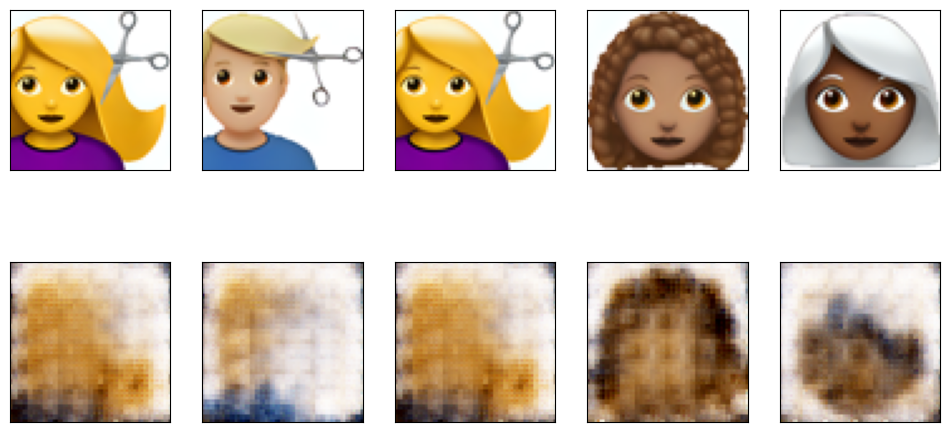

Epoch 91/100 | Training loss: 1.4194
Epoch 91/100 | Validation loss: 1.3629
Epoch 92/100 | Training loss: 1.4221
Epoch 92/100 | Validation loss: 1.3546
Epoch 93/100 | Training loss: 1.4064
Epoch 93/100 | Validation loss: 1.3564
Epoch 94/100 | Training loss: 1.3995
Epoch 94/100 | Validation loss: 1.3581


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 95/100 | Training loss: 1.4025
Epoch 95/100 | Validation loss: 1.3474


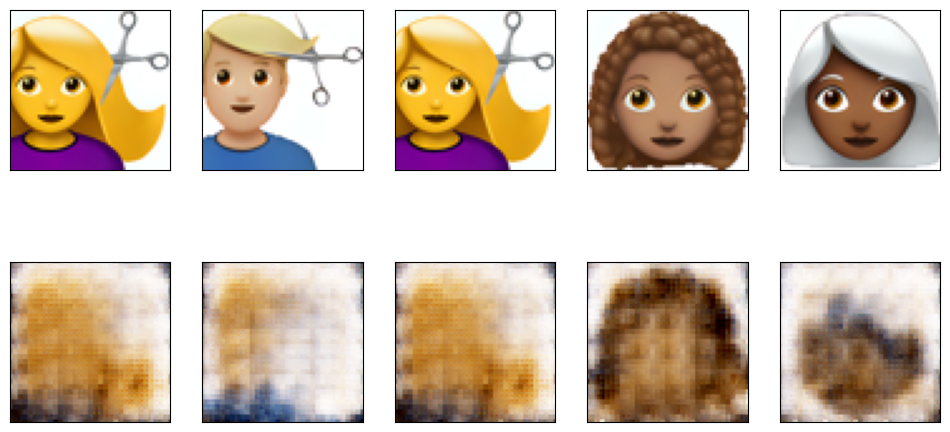

Epoch 96/100 | Training loss: 1.4044
Epoch 96/100 | Validation loss: 1.3305
Epoch 97/100 | Training loss: 1.3904
Epoch 97/100 | Validation loss: 1.3376
Epoch 98/100 | Training loss: 1.3877
Epoch 98/100 | Validation loss: 1.3356
Epoch 99/100 | Training loss: 1.3800
Epoch 99/100 | Validation loss: 1.3355
Epoch 100/100 | Training loss: 1.3777
Epoch 100/100 | Validation loss: 1.3352


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


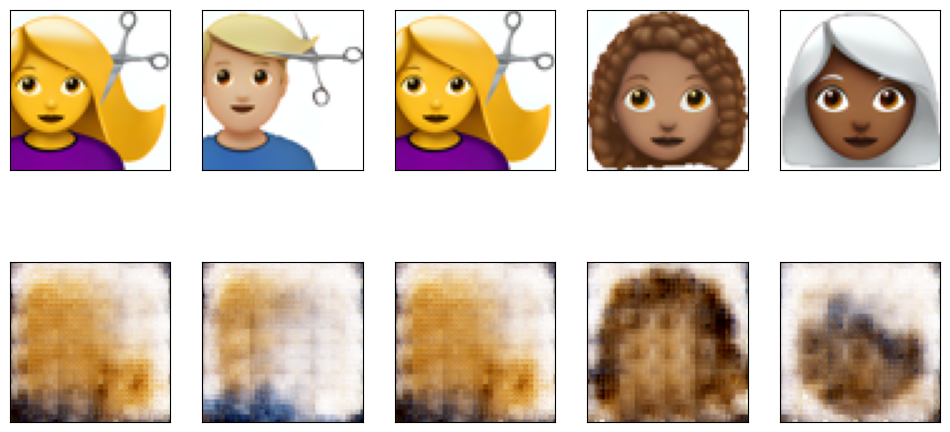

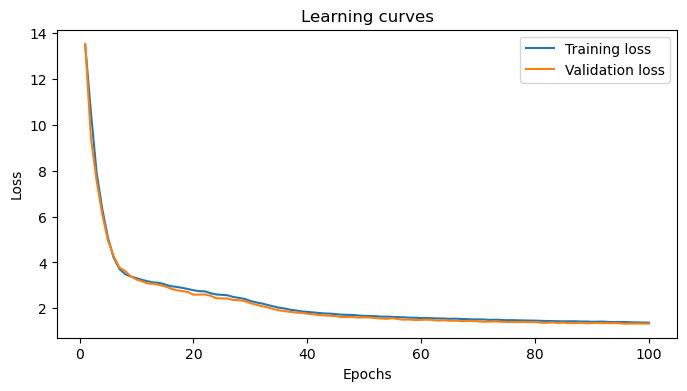

Test loss: 1.1888


In [45]:
import matplotlib.pyplot as plt

class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=3, padding=1),  # b, 16, 22, 22
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2),  # b, 16, 11, 11
            nn.Conv2d(16, 8, 3, stride=2, padding=1),  # b, 8, 6, 6
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=1)  # b, 8, 5, 5
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(8, 16, 3, stride=2),  # b, 16, 11, 11
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 5, stride=3, padding=1),  # b, 8, 33, 33
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 3, 2, stride=2, padding=1),  # b, 3, 64, 64
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
    
# Create the autoencoder model
model = Autoencoder()

# Define the loss function and the optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
n_epochs = 100

train_losses = []
val_losses = []

for epoch in range(1, n_epochs+1):
    train_loss = 0.0
    for data in train_dataloader:
        images = data
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)
    train_loss = train_loss / len(train_dataloader)
    train_losses.append(train_loss)
    print(f"Epoch {epoch}/{n_epochs} | Training loss: {train_loss:.4f}")

    # Validate the model
    val_loss = 0.0
    for data in val_dataloader:
        images = data
        outputs = model(images)
        loss = criterion(outputs, images)
        val_loss += loss.item() * images.size(0)
    val_loss = val_loss / len(val_dataloader)
    val_losses.append(val_loss)
    print(f"Epoch {epoch}/{n_epochs} | Validation loss: {val_loss:.4f}")

    # Display the test images and the reconstructed images from the autoencoder. This will allow us to see how well we're performing. 
    if epoch == 1 or epoch % 5 == 0:
        test_images = next(iter(test_dataloader))
        reconstructed_images = model(test_images)
        test_images = test_images.numpy()
        reconstructed_images = reconstructed_images.detach().numpy()
        fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(12, 6))
        for images, row in zip([test_images, reconstructed_images], axes):
            for img, ax in zip(images, row):
                ax.imshow(np.squeeze(img).transpose(1, 2, 0))
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
        plt.show()

    # Display learning curves
    if epoch == n_epochs:
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.plot(range(1, epoch+1), train_losses, label='Training loss')
        ax.plot(range(1, epoch+1), val_losses, label='Validation loss')
        ax.set_title('Learning curves')
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.legend()
        plt.show()


# Save the model
model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)
model_path = os.path.join(model_dir, 'autoencoder.pth')
torch.save(model.state_dict(), model_path)

# Load the model
model = Autoencoder()
model.load_state_dict(torch.load(model_path))

# Evaluate the model
test_loss = 0.0
for data in test_dataloader:
    images = data
    outputs = model(images)
    loss = criterion(outputs, images)
    test_loss += loss.item() * images.size(0)

# Calculate the average test loss
test_loss = test_loss / len(test_dataloader)
print(f"Test loss: {test_loss:.4f}")


# Problem 2

In [12]:
def filter_and_label_images(dataset, theme):
    filtered_images = []
    labels = []
    for i, text in enumerate(dataset['train']['text']):
        if theme in text:
            if 'person' in text:
                labels.append(0)
                filtered_images.append(dataset['train']['image'][i])
            elif 'woman' in text:
                labels.append(1)
                filtered_images.append(dataset['train']['image'][i])
            elif 'man' in text:
                labels.append(2)
                filtered_images.append(dataset['train']['image'][i])
    return filtered_images, labels

# Filter the images and assign labels
filtered_images, labels = filter_and_label_images(dataset, theme)

# Display the length of the filtered images and labels
print(f"Number of images with the theme '{theme}': {len(filtered_images)}")
print(f"Number of labels: {len(labels)}")


Number of images with the theme 'hair': 54
Number of labels: 54


In [13]:
def resize_images(images, size):
    resized_images = []
    for image in images:
        img = image.resize(size)
        resized_images.append(img)
    return resized_images

# Resize the images
size = (64, 64)
resized_images = resize_images(filtered_images, size)

In [14]:
# Let's split the images and corresponding labels into training, validation, and test sets using a 60-20-20 split.
train_images, val_test_images, train_labels, val_test_labels = train_test_split(resized_images, labels, test_size=0.4, random_state=42)
val_images, test_images, val_labels, test_labels = train_test_split(val_test_images, val_test_labels, test_size=0.5, random_state=42)

# Display the number of images in each set
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")

Number of training images: 32
Number of validation images: 11
Number of test images: 11


In [21]:
# Expand the dataset by duplicating the images and labels to be 600, 200, and 200 for the training, validation, and test sets, respectively.
train_images = train_images * (600 // len(train_images))
val_images = val_images * (200 // len(val_images))
test_images = test_images * (200 // len(test_images))
train_labels = train_labels * (600 // len(train_labels))
val_labels = val_labels * (200 // len(val_labels))
test_labels = test_labels * (200 // len(test_labels))

# Display the number of images in each set
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")

Number of training images: 576
Number of validation images: 198
Number of test images: 198
[1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 0, 2, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2,

In [22]:
# Create the EmojiDataset2 class to load the images and labels
class EmojiDataset2(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

In [23]:
# Create the training, validation, and test datasets
from torchvision import transforms
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.ToTensor()
])

train_dataset2 = EmojiDataset2(train_images, train_labels, transform=transform)
val_dataset2 = EmojiDataset2(val_images, val_labels, transform=transforms.ToTensor())
test_dataset2 = EmojiDataset2(test_images, test_labels, transform=transforms.ToTensor())

# Create the training, validation, and test dataloaders
train_dataloader2 = DataLoader(train_dataset2, batch_size=32, shuffle=True)
val_dataloader2 = DataLoader(val_dataset2, batch_size=32, shuffle=False)
test_dataloader2 = DataLoader(test_dataset2, batch_size=32, shuffle=False)

In [57]:
import torch.nn.functional as F

class AutoencoderWithClassifier(nn.Module):
    def __init__(self):
        super(AutoencoderWithClassifier, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=3, padding=1),  # b, 16, 22, 22
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2),  # b, 16, 11, 11
            nn.Conv2d(16, 8, 3, stride=2, padding=1),  # b, 8, 6, 6
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=1)  # b, 8, 5, 5
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(8, 16, 3, stride=2),  # b, 16, 11, 11
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 5, stride=3, padding=1),  # b, 8, 33, 33
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 3, 2, stride=2, padding=1),  # b, 3, 64, 64
            nn.Tanh()
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(8 * 5 * 5, 256),
            nn.ReLU(True),
            nn.Dropout(0.2),  # Add dropout with a probability of 0.5
            nn.Linear(256, 128),
            nn.ReLU(True),
            nn.Dropout(0.2),  # Add dropout with a probability of 0.5
            nn.Linear(128, 64),
            nn.ReLU(True),
            nn.Dropout(0.2),  # Add dropout with a probability of 0.5
            nn.Linear(64, 32),
            nn.Dropout(0.2),  # Add dropout with a probability of 0.5
            nn.Sigmoid(),
            nn.Linear(32, 3)
        )

    def forward(self, initial_x):
        enc_x = self.encoder(initial_x)
        x = self.decoder(enc_x)
        aux = self.classifier(enc_x)
        return x, aux

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1/100 | Training loss: 14.0433 | MSE loss: 13.8911 | Classifier loss: 30.4377
Epoch 1/100 | Validation loss: 15.5504 | MSE loss: 15.3787 | Classifier loss: 34.3345


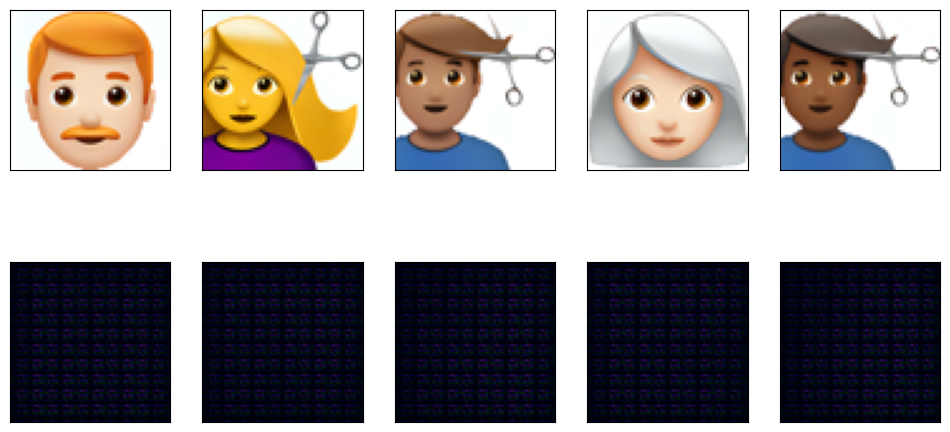

Epoch 2/100 | Training loss: 10.3847 | MSE loss: 10.2424 | Classifier loss: 28.4620
Epoch 2/100 | Validation loss: 8.4473 | MSE loss: 8.2596 | Classifier loss: 37.5388
Epoch 3/100 | Training loss: 6.9369 | MSE loss: 6.7981 | Classifier loss: 27.7650
Epoch 3/100 | Validation loss: 5.9856 | MSE loss: 5.8120 | Classifier loss: 34.7309
Epoch 4/100 | Training loss: 5.2568 | MSE loss: 5.1383 | Classifier loss: 23.7110
Epoch 4/100 | Validation loss: 4.5196 | MSE loss: 4.3620 | Classifier loss: 31.5133
Epoch 5/100 | Training loss: 4.4895 | MSE loss: 4.3963 | Classifier loss: 18.6321
Epoch 5/100 | Validation loss: 3.7397 | MSE loss: 3.5810 | Classifier loss: 31.7456
Epoch 6/100 | Training loss: 4.0027 | MSE loss: 3.9268 | Classifier loss: 15.1636
Epoch 6/100 | Validation loss: 3.1946 | MSE loss: 3.0515 | Classifier loss: 28.6163
Epoch 7/100 | Training loss: 3.6744 | MSE loss: 3.6125 | Classifier loss: 12.3825
Epoch 7/100 | Validation loss: 2.7440 | MSE loss: 2.6098 | Classifier loss: 26.8369
Ep

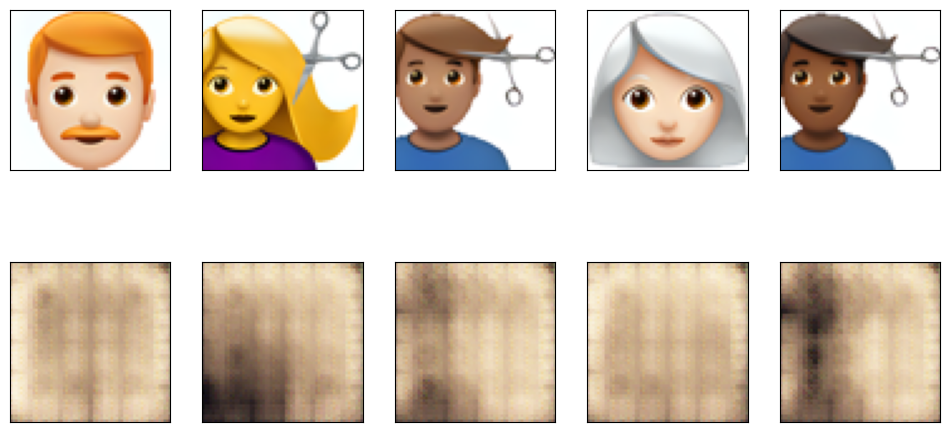

Epoch 21/100 | Training loss: 2.4271 | MSE loss: 2.3841 | Classifier loss: 8.6059
Epoch 21/100 | Validation loss: 1.4904 | MSE loss: 1.3958 | Classifier loss: 18.9305
Epoch 22/100 | Training loss: 2.3823 | MSE loss: 2.3423 | Classifier loss: 7.9990
Epoch 22/100 | Validation loss: 1.5202 | MSE loss: 1.3998 | Classifier loss: 24.0930
Epoch 23/100 | Training loss: 2.3649 | MSE loss: 2.3306 | Classifier loss: 6.8633
Epoch 23/100 | Validation loss: 1.5127 | MSE loss: 1.3840 | Classifier loss: 25.7458
Epoch 24/100 | Training loss: 2.3342 | MSE loss: 2.2999 | Classifier loss: 6.8670
Epoch 24/100 | Validation loss: 1.4711 | MSE loss: 1.3644 | Classifier loss: 21.3479
Epoch 25/100 | Training loss: 2.3065 | MSE loss: 2.2679 | Classifier loss: 7.7344
Epoch 25/100 | Validation loss: 1.4556 | MSE loss: 1.3368 | Classifier loss: 23.7630
Epoch 26/100 | Training loss: 2.2874 | MSE loss: 2.2530 | Classifier loss: 6.8855
Epoch 26/100 | Validation loss: 1.4530 | MSE loss: 1.3277 | Classifier loss: 25.060

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


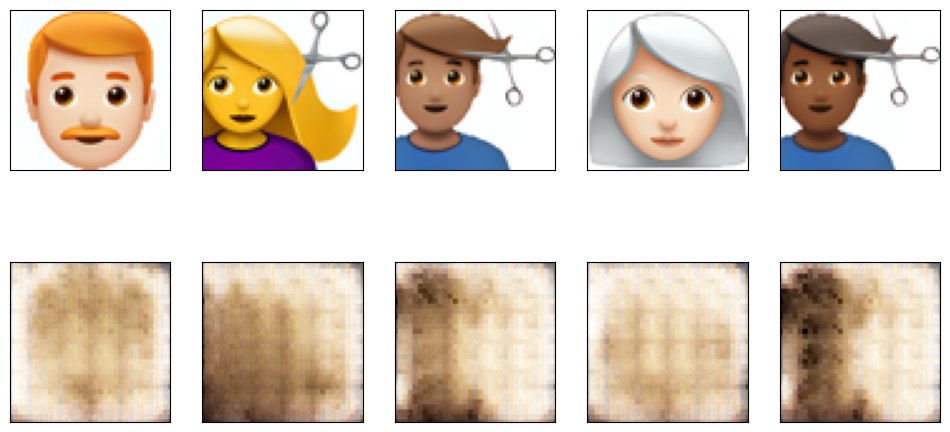

Epoch 41/100 | Training loss: 1.9458 | MSE loss: 1.9147 | Classifier loss: 6.2106
Epoch 41/100 | Validation loss: 1.1787 | MSE loss: 1.0877 | Classifier loss: 18.2018
Epoch 42/100 | Training loss: 1.9309 | MSE loss: 1.8999 | Classifier loss: 6.2148
Epoch 42/100 | Validation loss: 1.1992 | MSE loss: 1.0897 | Classifier loss: 21.9012
Epoch 43/100 | Training loss: 1.9075 | MSE loss: 1.8763 | Classifier loss: 6.2282
Epoch 43/100 | Validation loss: 1.1573 | MSE loss: 1.0688 | Classifier loss: 17.7110
Epoch 44/100 | Training loss: 1.8785 | MSE loss: 1.8474 | Classifier loss: 6.2137
Epoch 44/100 | Validation loss: 1.1681 | MSE loss: 1.0643 | Classifier loss: 20.7612
Epoch 45/100 | Training loss: 1.8750 | MSE loss: 1.8439 | Classifier loss: 6.2197
Epoch 45/100 | Validation loss: 1.1574 | MSE loss: 1.0612 | Classifier loss: 19.2405
Epoch 46/100 | Training loss: 1.8507 | MSE loss: 1.8205 | Classifier loss: 6.0524
Epoch 46/100 | Validation loss: 1.1606 | MSE loss: 1.0576 | Classifier loss: 20.595

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60/100 | Training loss: 1.6865 | MSE loss: 1.6630 | Classifier loss: 4.7119
Epoch 60/100 | Validation loss: 1.0946 | MSE loss: 0.9862 | Classifier loss: 21.6930


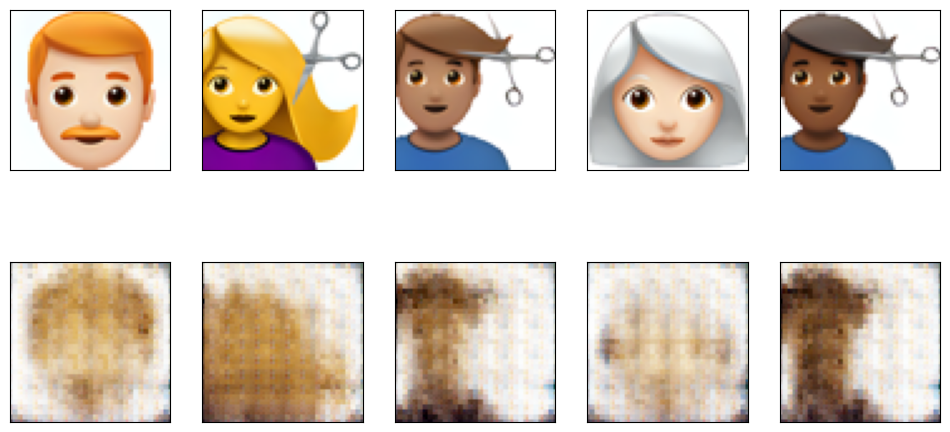

Epoch 61/100 | Training loss: 1.6635 | MSE loss: 1.6410 | Classifier loss: 4.4928
Epoch 61/100 | Validation loss: 1.0483 | MSE loss: 0.9733 | Classifier loss: 15.0070
Epoch 62/100 | Training loss: 1.6485 | MSE loss: 1.6304 | Classifier loss: 3.6216
Epoch 62/100 | Validation loss: 1.0287 | MSE loss: 0.9649 | Classifier loss: 12.7578
Epoch 63/100 | Training loss: 1.6301 | MSE loss: 1.6123 | Classifier loss: 3.5507
Epoch 63/100 | Validation loss: 1.0299 | MSE loss: 0.9677 | Classifier loss: 12.4481
Epoch 64/100 | Training loss: 1.6246 | MSE loss: 1.6058 | Classifier loss: 3.7445
Epoch 64/100 | Validation loss: 1.0369 | MSE loss: 0.9502 | Classifier loss: 17.3367
Epoch 65/100 | Training loss: 1.6128 | MSE loss: 1.5944 | Classifier loss: 3.6842
Epoch 65/100 | Validation loss: 1.0093 | MSE loss: 0.9503 | Classifier loss: 11.8108
Epoch 66/100 | Training loss: 1.6119 | MSE loss: 1.5947 | Classifier loss: 3.4456
Epoch 66/100 | Validation loss: 1.0002 | MSE loss: 0.9380 | Classifier loss: 12.422

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80/100 | Training loss: 1.4994 | MSE loss: 1.4910 | Classifier loss: 1.6725
Epoch 80/100 | Validation loss: 0.9446 | MSE loss: 0.8974 | Classifier loss: 9.4364


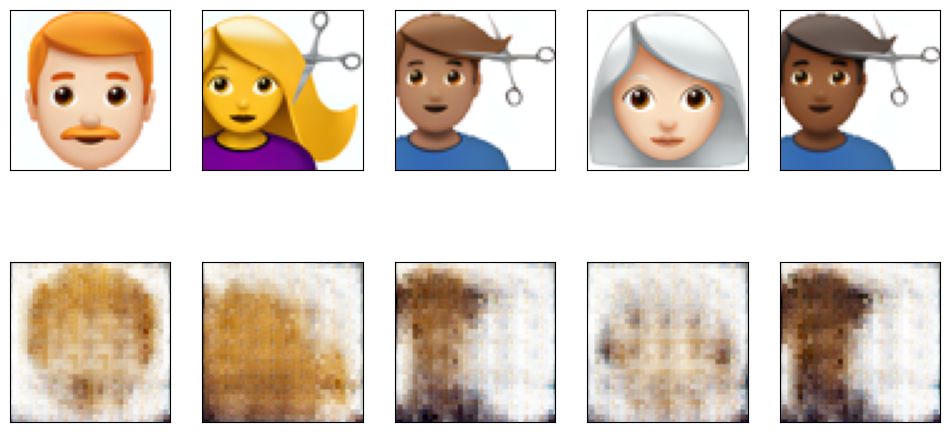

Epoch 81/100 | Training loss: 1.4941 | MSE loss: 1.4854 | Classifier loss: 1.7329
Epoch 81/100 | Validation loss: 0.9660 | MSE loss: 0.8930 | Classifier loss: 14.5891
Epoch 82/100 | Training loss: 1.4975 | MSE loss: 1.4888 | Classifier loss: 1.7323
Epoch 82/100 | Validation loss: 0.9387 | MSE loss: 0.8921 | Classifier loss: 9.3095
Epoch 83/100 | Training loss: 1.4686 | MSE loss: 1.4610 | Classifier loss: 1.5215
Epoch 83/100 | Validation loss: 0.9522 | MSE loss: 0.9041 | Classifier loss: 9.6052
Epoch 84/100 | Training loss: 1.4652 | MSE loss: 1.4594 | Classifier loss: 1.1678
Epoch 84/100 | Validation loss: 0.9137 | MSE loss: 0.8801 | Classifier loss: 6.7344
Epoch 85/100 | Training loss: 1.4614 | MSE loss: 1.4550 | Classifier loss: 1.2803
Epoch 85/100 | Validation loss: 0.9501 | MSE loss: 0.8773 | Classifier loss: 14.5497
Epoch 86/100 | Training loss: 1.4505 | MSE loss: 1.4399 | Classifier loss: 2.1162
Epoch 86/100 | Validation loss: 0.9127 | MSE loss: 0.8699 | Classifier loss: 8.5665
Ep

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 100/100 | Training loss: 1.3787 | MSE loss: 1.3735 | Classifier loss: 1.0329
Epoch 100/100 | Validation loss: 0.9286 | MSE loss: 0.8325 | Classifier loss: 19.2021


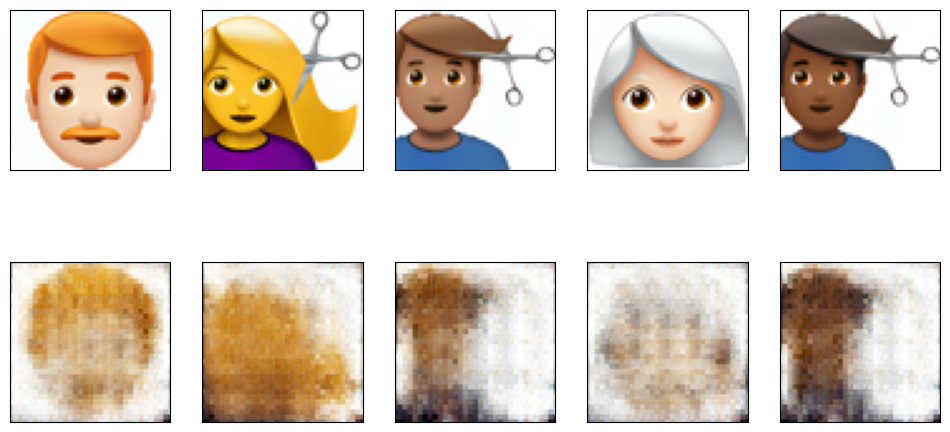

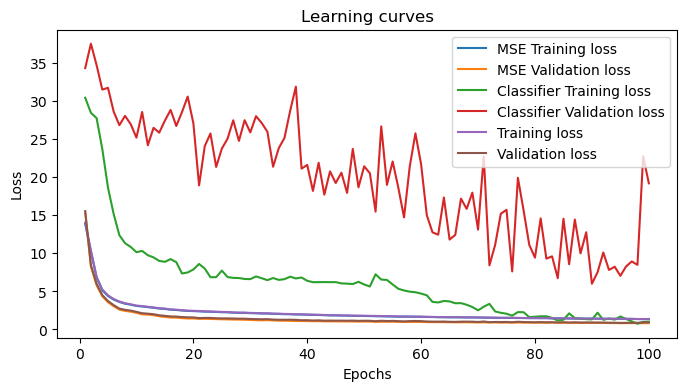

Test loss: 0.9431


In [58]:
# Train the model

# Create the autoencoder model
model = AutoencoderWithClassifier()

# Define the loss function and the optimizer
criterion = nn.MSELoss()
classifier_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
n_epochs = 100

train_losses = []
mse_losses = []
classifier_losses = []
val_mse_losses = []
val_classifier_losses = []
val_losses = []

# Train the model with the auxiliary classifier included in the loss function
# L = L_autoencoder + lambda*L_classifier
# lambda is the auxiliary_loss_weight
auxiliary_loss_weight = 0.005
for epoch in range(1, n_epochs+1):
    mse_loss = 0.0
    classifier_loss = 0.0
    train_loss = 0.0
    for data in train_dataloader2:
        images, labels = data
        optimizer.zero_grad()
        outputs, aux_outputs = model(images)
        mse = criterion(outputs, images)
        classifier = classifier_criterion(aux_outputs, labels)
        loss = mse + auxiliary_loss_weight * classifier
        loss.backward()
        optimizer.step()
        mse_loss += mse.item() * images.size(0)
        classifier_loss += classifier.item() * images.size(0)
        train_loss += loss.item() * images.size(0)
    mse_loss = mse_loss / len(train_dataloader2)
    classifier_loss = classifier_loss / len(train_dataloader2)
    train_loss = train_loss / len(train_dataloader2)
    mse_losses.append(mse_loss)
    classifier_losses.append(classifier_loss)
    train_losses.append(train_loss)
    print(f"Epoch {epoch}/{n_epochs} | Training loss: {train_loss:.4f} | MSE loss: {mse_loss:.4f} | Classifier loss: {classifier_loss:.4f}")

    # Validate the model
    val_mse = 0.0
    val_classifier = 0.0
    val_loss = 0.0
    for data in val_dataloader2:
        images, labels = data
        outputs, aux_outputs = model(images)
        val_mse_loss = criterion(outputs, images)
        val_classifier_loss = classifier_criterion(aux_outputs, labels)
        loss = val_mse_loss + auxiliary_loss_weight * val_classifier_loss
        val_mse += val_mse_loss.item() * images.size(0)
        val_classifier += val_classifier_loss.item() * images.size(0)
        val_loss += loss.item() * images.size(0)
    val_mse = val_mse / len(val_dataloader2)
    val_classifier = val_classifier / len(val_dataloader2)
    val_loss = val_loss / len(val_dataloader2)
    val_mse_losses.append(val_mse)
    val_classifier_losses.append(val_classifier)
    val_losses.append(val_loss)
    print(f"Epoch {epoch}/{n_epochs} | Validation loss: {val_loss:.4f} | MSE loss: {val_mse:.4f} | Classifier loss: {val_classifier:.4f}")

    # Display the test images and the reconstructed images from the autoencoder. This will allow us to see how well we're performing. 
    if epoch == 1 or epoch % 20 == 0:
        test_images, _ = next(iter(test_dataloader2))
        reconstructed_images, _ = model(test_images)
        test_images = test_images.numpy()
        reconstructed_images = reconstructed_images.detach().numpy()
        fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(12, 6))
        for images, row in zip([test_images, reconstructed_images], axes):
            for img, ax in zip(images, row):
                ax.imshow(np.squeeze(img).transpose(1, 2, 0))
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
        plt.show()

    # Display learning curves
    if epoch == n_epochs:
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.plot(range(1, epoch+1), mse_losses, label='MSE Training loss')
        ax.plot(range(1, epoch+1), val_mse_losses, label='MSE Validation loss')
        ax.plot(range(1, epoch+1), classifier_losses, label='Classifier Training loss')
        ax.plot(range(1, epoch+1), val_classifier_losses, label='Classifier Validation loss')
        ax.plot(range(1, epoch+1), train_losses, label='Training loss')
        ax.plot(range(1, epoch+1), val_losses, label='Validation loss')
        ax.set_title('Learning curves')
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.legend()
        plt.show()


# Save the model
model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)
model_path = os.path.join(model_dir, 'autoencoderwithclassifier.pth')
torch.save(model.state_dict(), model_path)

# Load the model
model = AutoencoderWithClassifier()
model.load_state_dict(torch.load(model_path))

# Evaluate the model
test_loss = 0.0
for data in test_dataloader2:
    images, labels = data
    outputs, _ = model(images)
    loss = criterion(outputs, images)
    test_loss += loss.item() * images.size(0)

# Calculate the average test loss
test_loss = test_loss / len(test_dataloader2)
print(f"Test loss: {test_loss:.4f}")

## Problem 2 Discussion
We see that adding the auxiliary task improves our autoencoder's performance. We go from an MSE of 1.18 previously on the test set to .94. This makes sense as it forces the model to learn more general features about the data such as the classification of man, woman, or person. However, the improvement could be better. We can see from our loss curves that the classification task does not generalize as well as it could (validation loss is still very high for that task). We did a few things to improve learning such as adding dropout and adjust the lamda parameter for the auxiliary loss. However, this is probably do to a fault in the data. "Person" is not easily distinguishable from "man" or "woman," thus the model ends up memorizing more than generalizing. It would be better to have more data to train on, and only include a balanced set of "man" or "woman" emojis.

# Problem 3

In [89]:
# Get glasses images

theme = 'nerd'
nerd = filter_images(dataset, theme)

bald= filter_images(dataset, 'man bald')

# Resize the images
size = (64, 64)
nerd = resize_images(nerd, size)
bald = resize_images(bald, size)
nerd = nerd[0]
bald = bald[0]

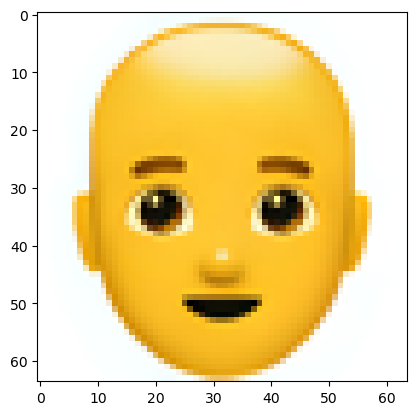

In [90]:
plt.imshow(bald)

# transform the image to a tensor
transform = transforms.ToTensor()
nerd = transform(nerd).unsqueeze(0)
bald = transform(bald).unsqueeze(0)

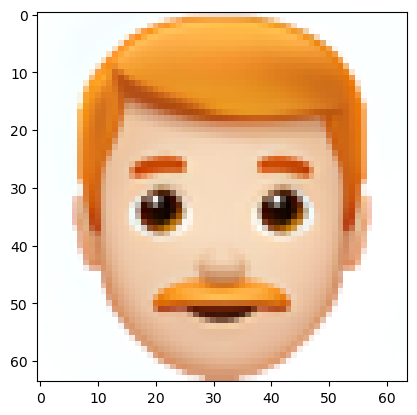

In [91]:
# get the first test image
test_images, _ = next(iter(test_dataloader2))
man_with_beard = test_images[0].unsqueeze(0)

test_images = test_images.numpy()

man_with_beard_test = test_images[0]

# plot the first test image
plt.imshow(np.squeeze(man_with_beard_test).transpose(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


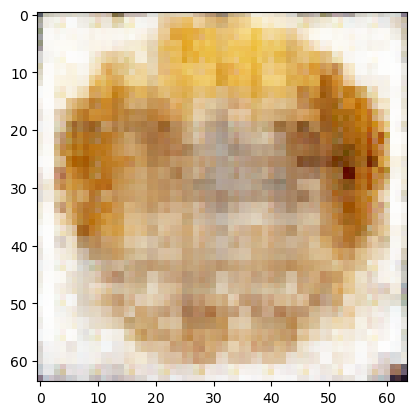

In [92]:
img_vecs = [nerd, bald, man_with_beard]

# Encode the images
encoded_img_vecs = []
for img_vec in img_vecs:
    encoded_img_vec = model.encoder(img_vec)
    encoded_img_vecs.append(encoded_img_vec)

# Add the encodings together
combined_encoding = torch.subtract(encoded_img_vecs[0], encoded_img_vecs[1])
combined_encoding = torch.add(combined_encoding, encoded_img_vecs[2])

# Decode the combined encoding
combined_image = model.decoder(combined_encoding)

# Plot the combined image
plt.imshow(np.squeeze(combined_image.detach().numpy()).transpose(1, 2, 0))


## Problem 3 Discussion
Well this is quite bad but given our autoencoder wasn't very good, this is to be expected. We subtracted a bald man from the nerd to hopefully get the glasses and teeth to add to the man with red hair and beard from our test set. You can see some darkening around the eyes where one might expect glasses to be, but the teeth are not very clear. Since the model was only tested on a small subset of the emojis it is not expected to generalize the understanding of eye glasses well. Making the architecture of the autoencoder deeper and wider and as well as testing on a greater sample of the emoji dataset would improve our output. 